In [1]:
import cv2
import matplotlib.pyplot as plt
from deep_sort_realtime.deepsort_tracker import DeepSort 
import openpifpaf as opp
from PIL import Image
import matplotlib.pyplot as plt
from deep_sort_realtime.deepsort_tracker import DeepSort
import pandas as pd
import numpy as np
from IPython.display import display
from ultralytics import YOLO
import torch

/home/alber/anaconda3/envs/masters_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# ## first frame
# # the first frame

# video_path = "../inference/video/pannel_discussion_3_students.webm"

# cap = cv2.VideoCapture(video_path)

# i = 0
# while True:


#     cat, frame = cap.read()

#     if not cat: 
#         break

#     i += 1
#     if i == 50:
#         break

In [3]:
# plt.figure(figsize=(15,15))
# plt.imshow(frame)

# plt.axis("off")
# plt.show()

In [4]:
# orig_image_path = "../inference/image/first_frame_panel_3.png"

# plt.imsave(orig_image_path,frame)
orig_image_path = "../inference/image/people.png"

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = YOLO("yolov8n-pose.pt")
model = model.to(device)

results = model.track(orig_image_path,show=True,save=True,save_dir='./runs/')
result = results[0]


image 1/1 /home/alber/Desktop/DSB3/behavior-tracking-with-landmarks/src/../inference/image/people.png: 384x640 5 persons, 16.8ms
Speed: 1.5ms preprocess, 16.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/pose/track35


In [6]:
# poses հայերեն
landmark_arm = {'nose':"քիթ",
                'left_eye': "ձախ աչք",
                'right_eye':"աջ աչք",
                'left_ear' : "ձախ ականջ",
                'right_ear':"աջ ականջ",
                'left_shoulder':"ձախ ուս",
                'right_shoulder':"աջ ուս",
                'left_elbow':"ձախ արմունկ",
                'right_elbow':"աջ արմունկ",
                'left_wrist':"ձախ դաստակ",
                'right_wrist':"աջ դաստակ",
                'left_hip': "ձախ կոնքոսկր",
                'right_hip': "աջ կոնքոսկր",
                'left_knee': "ձախ ծունկ",
                'right_knee': "աջ ծունկ", 
                'left_ankle': "ձախ կոճ" ,
                'right_ankle': "աջ կոճ"}

    # Nose
    # Left Eye
    # Right Eye
    # Left Ear
    # Right Ear
    # Left Shoulder
    # Right Shoulder
    # Left Elbow
    # Right Elbow
    # Left Wrist
    # Right Wrist
    # Left Hip
    # Right Hip
    # Left Knee
    # Right Knee
    # Left Ankle
    # Right Ankle

keypoints = result.keypoints.data[0]

In [7]:

# Add text to the image
# cv2.putText(image, text, position, font, font_scale, font_color, thickness, line_type)
orig_image = plt.imread("../inference/image/single_image.png")


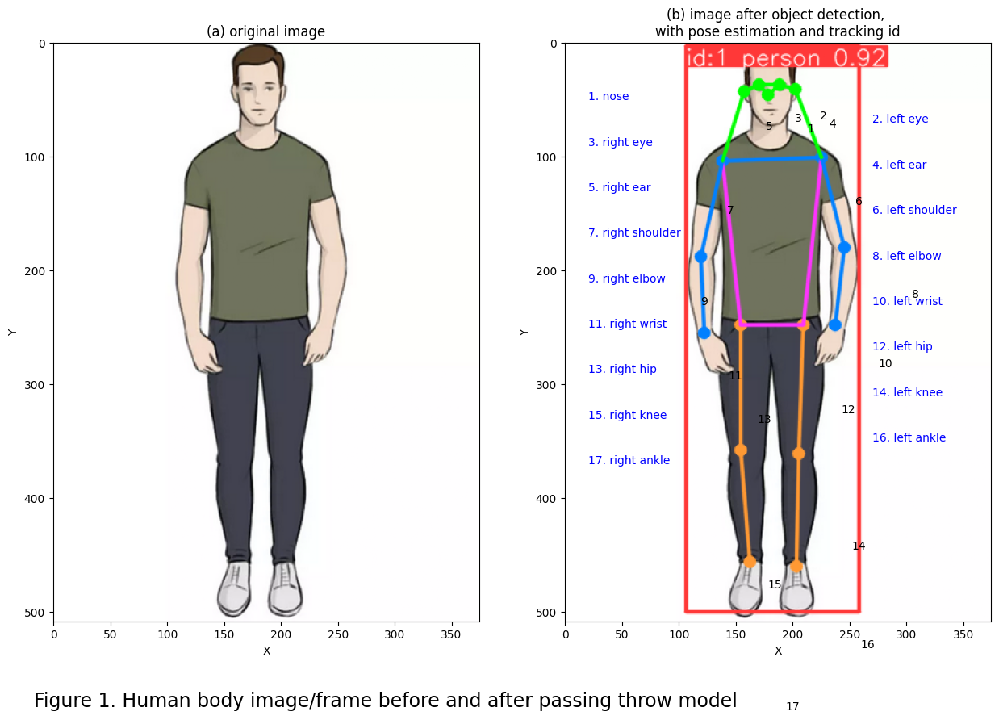

In [8]:

image = plt.imread("../inference/image/single_image_with_points_2.png").copy()

# plt.figure(figsize=(15,10))

fig,ax = plt.subplots(1,2)

fig.set_figwidth(15)
fig.set_figheight(10)

fig.suptitle("Figure 1. Human body image/frame before and after passing throw model",fontsize=17, x=0.4, y=0.05, ha='center')

# fig.text(0, -0.1, 'Title left and below', fontsize=12, ha='left', va='top', transform=plt.gca().transAxes)


font = cv2.FONT_HERSHEY_COMPLEX_SMALL
font_scale = 0.3
font_color = (0, 0, 0)  # White color in BGR format
thickness = 1
line_type = cv2.LINE_AA


text_y = 50
for i,key in enumerate(landmark_arm):
    
    x,y,_ = keypoints[i].cpu().numpy().astype(int)
    # landmark = landmark_arm[key]

    landmark = key.replace("_"," ")

    ind = str(i+1)
    # ax[1].scatter(x,y,)
    ax[1].text(x-3 if i < 8 else x-5,y+4,ind)

    text_x = 20 if i%2 == 0 else 270

    ax[1].text(text_x,text_y,ind + ". " + landmark,color='blue')
    text_y += 20
    # plt.text(
    

print()
ax[0].imshow(orig_image)
ax[0].set_ylabel("Y")
ax[0].set_xlabel("X")
ax[0].set_title("(a) original image")


ax[1].imshow(image)
ax[1].set_ylabel("Y")
ax[1].set_xlabel("X")
ax[1].set_title("(b) image after object detection, \nwith pose estimation and tracking id")




# plt.title("Մարդու մարմնի դիրքի կորդինատները\n")
# plt.show()
plt.show()

In [9]:
detecter = YOLO("yolov8m.pt")
detecter = detecter.to(device)

In [10]:
# img_detect = plt.imread("../inference/image/people.png")
det_path = "../inference/image/people.png"
orig_image = plt.imread(orig_image_path).copy()
# orig_image = frame.copy()

In [11]:
det_result = detecter.predict(orig_image_path,show=True,save=True,save_dir='./runs/')


image 1/1 /home/alber/Desktop/DSB3/behavior-tracking-with-landmarks/src/../inference/image/people.png: 384x640 5 persons, 7 cars, 26.7ms
Speed: 1.3ms preprocess, 26.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict10


In [12]:
detected_image = plt.imread("./runs/detect/predict8/people.png")
# detected_image = plt.imread("./runs/detect/predict6/first_frame_panel_3.png")


In [13]:
# track to cover faces
orig_image_track = model.track(orig_image_path,show=True,save=True,save_dir='./runs/')


image 1/1 /home/alber/Desktop/DSB3/behavior-tracking-with-landmarks/src/../inference/image/people.png: 384x640 5 persons, 10.3ms
Speed: 1.2ms preprocess, 10.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/pose/track35


In [14]:
# fig,ax = plt.subplots(1,2)


# fig.suptitle("Figure 1. Object detection",fontsize=17, x=0.2, y=0.35, ha='center')

# fig.set_figheight(20)
# fig.set_figwidth(20)

# ax[0].axis("off")
# ax[0].imshow(orig_image)
# ax[0].set_title("(a) original image")

# ax[1].imshow(detected_image)
# ax[1].axis("off")
# ax[1].set_title("(b) after object detection")



# plt.show()



In [15]:
x,y

(199, 582)

In [16]:

img = cv2.imread("../inference/image/people.png")
blurred_img = cv2.GaussianBlur(img, (21, 21), 0)

# Apply Gaussian blur to the input image

# Create a mask with the same shape as the input image
mask = np.zeros_like(img)

# Draw a filled white circle on the mask
mask = cv2.circle(mask, (200, 100),100, (255, 255, 255), -1)

# Use the mask to choose between the original and blurred image
out = np.where(mask == np.array([255, 255, 255]), img, blurred_img)



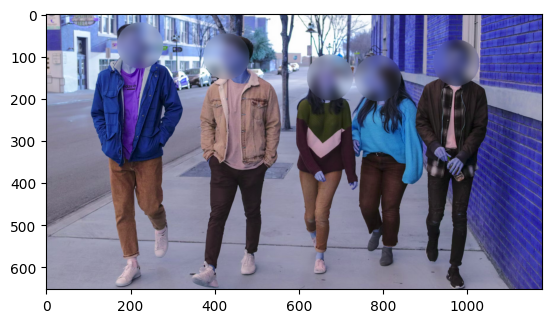

In [17]:
orig_image_cv = cv2.imread("../inference/image/people.png")

show_img = orig_image_cv.copy()
blurred_img = cv2.GaussianBlur(img, (71, 71), 0)

for res in orig_image_track[0]:

    ID = res.boxes.id.item()

    x,y,_ = [int(x) for x in res.keypoints.data.cpu().numpy()[0][0]]

    x = x+7

    # Create a mask with the same shape as the input image
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    
    # Draw a filled white circle on the mask
    cv2.circle(mask, (x, y), 55, (255), -1)
    
    # Invert the mask (convert white to black and vice versa)
    mask_inv = cv2.bitwise_not(mask)
    
    # Use the mask to choose between the original and blurred image
    show_img = cv2.bitwise_and(show_img, show_img, mask=mask_inv) + cv2.bitwise_and(blurred_img, blurred_img, mask=mask)


plt.imshow(show_img)

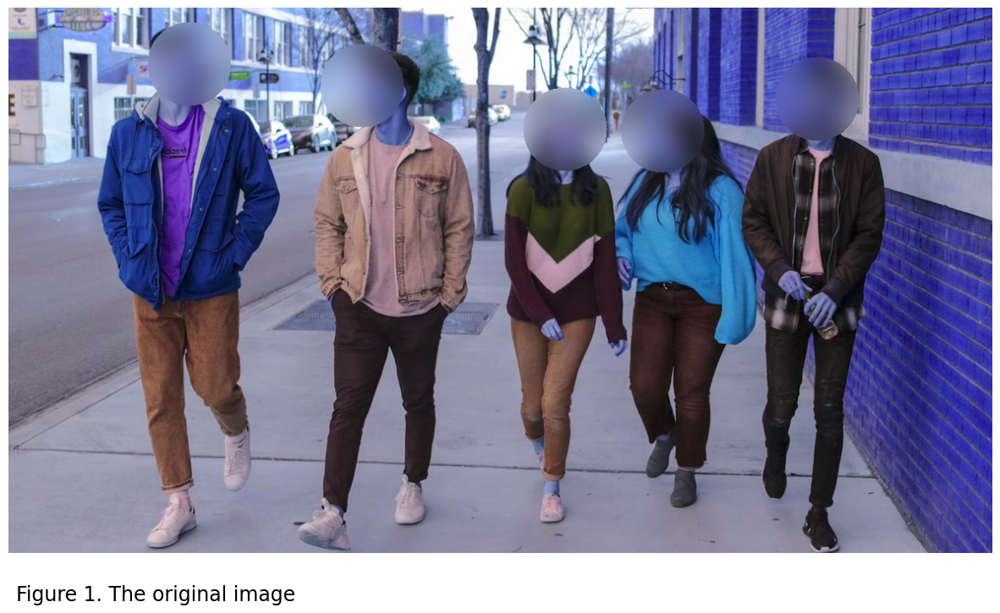

In [18]:


# blured_image = cv2.blur(blured_image,(10,10))
plt.figure(figsize=(15,15))

show_img = orig_image_cv.copy()
blurred_img = cv2.GaussianBlur(orig_image_cv, (101, 101), 0)

for res in orig_image_track[0]:

    ID = res.boxes.id.item()


    x = [int(x) for x in [res.keypoints.data.cpu().numpy()[0][0:3][i][:2][0] for i in range(3)]]
    y = [int(x) for x in [res.keypoints.data.cpu().numpy()[0][0:3][i][:2][1] for i in range(3)]]

    x = int(np.mean(x))
    y = int(np.mean(y))


    # Create a mask with the same shape as the input image
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    
    # Draw a filled white circle on the mask
    cv2.circle(mask, (x, y), 50, (255), -1)
    
    # Invert the mask (convert white to black and vice versa)
    mask_inv = cv2.bitwise_not(mask)
    
    # Use the mask to choose between the original and blurred image
    show_img = cv2.bitwise_and(show_img, show_img, mask=mask_inv) + cv2.bitwise_and(blurred_img, blurred_img, mask=mask)

plt.imshow(show_img)
plt.axis("off")

plt.title("Figure 1. The original image",fontsize=17, x=0.15, y=-.1, ha='center')

plt.show()



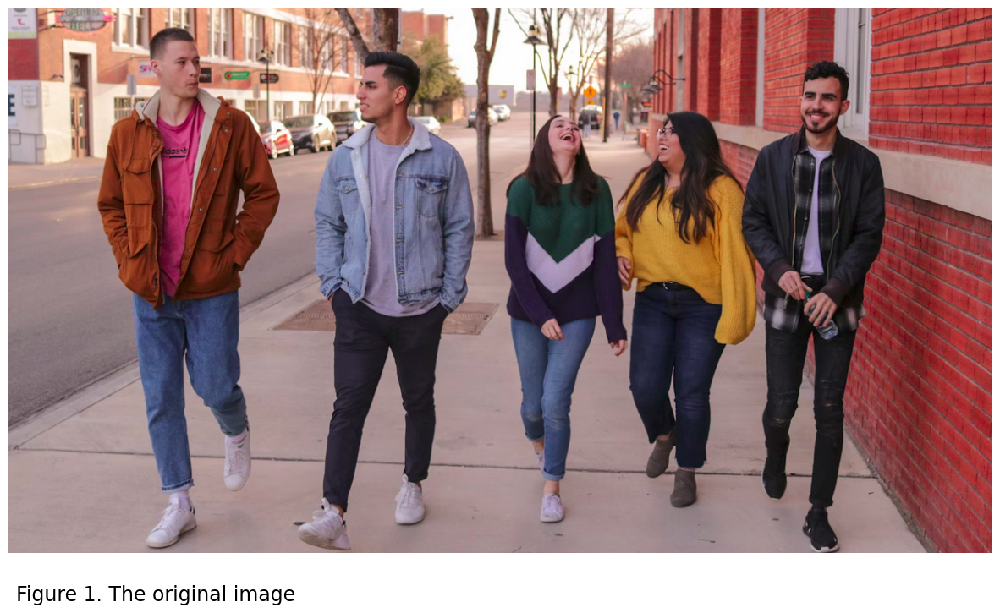

In [19]:
plt.figure(figsize=(15,15))

print("\n\n")


plt.imshow(orig_image)
plt.axis("off")

plt.title("Figure 1. The original image",fontsize=17, x=0.15, y=-.1, ha='center')

plt.show()

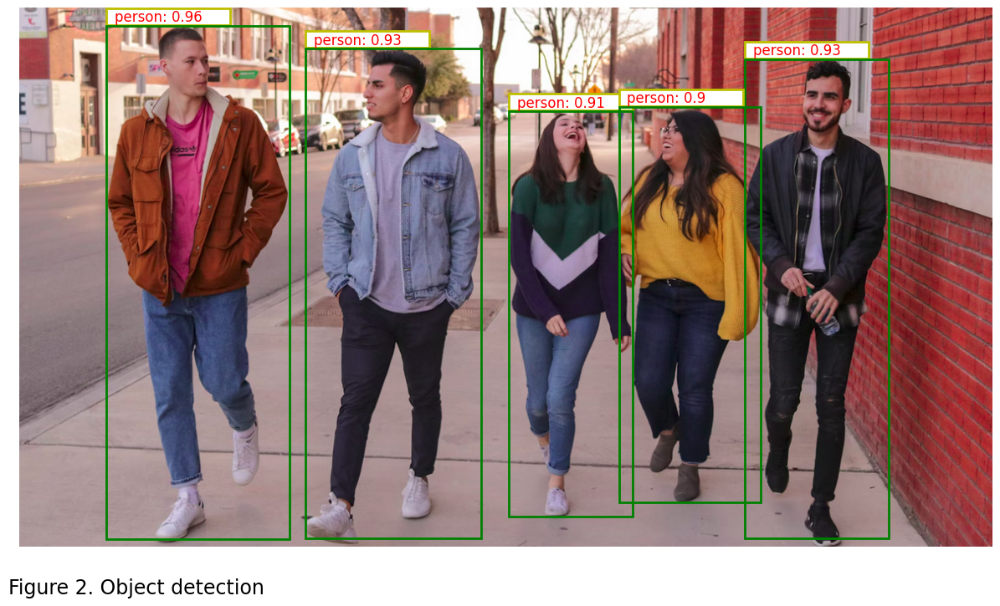

In [20]:
fig,ax = plt.subplots(1,1)

fig.set_figheight(15)
fig.set_figwidth(15)

print("\n\n")
for res in det_result[0]:

    bbox = res.boxes
    cls = bbox.cls.item()

    data = bbox.data.cpu().numpy()[0]
    
    if cls != 0:
        continue
    
    # Extracting bounding box coordinates
    xmin, ymin, xmax, ymax, score,_ = [x  for x in bbox.data.cpu().numpy()[0]]
    ymin, ymax = ymin, ymax
    
    
    # Add text for ID
    rect = plt.Rectangle((xmin, ymin-21), 150, 20, linewidth=2, edgecolor='y', facecolor='white')  # Green rectangle with thickness 2
    ax.add_patch(rect)
    
    ax.text(xmin+10, ymin-5, "person: " + str(round(score,2)), fontsize=12, color='r')
    # Create a rectangle patch
    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='g', facecolor='none')  # Green rectangle with thickness 2
    
    # Add the rectangle patch to the axes
    ax.add_patch(rect)

ax.axis("off")
ax.imshow(orig_image)

plt.title("Figure 2. Object detection",fontsize=17, x=0.12, y=-.1, ha='center')


plt.show()

In [21]:
data

array([     549.07,       118.3,       586.6,      144.08,     0.37704,           2], dtype=float32)

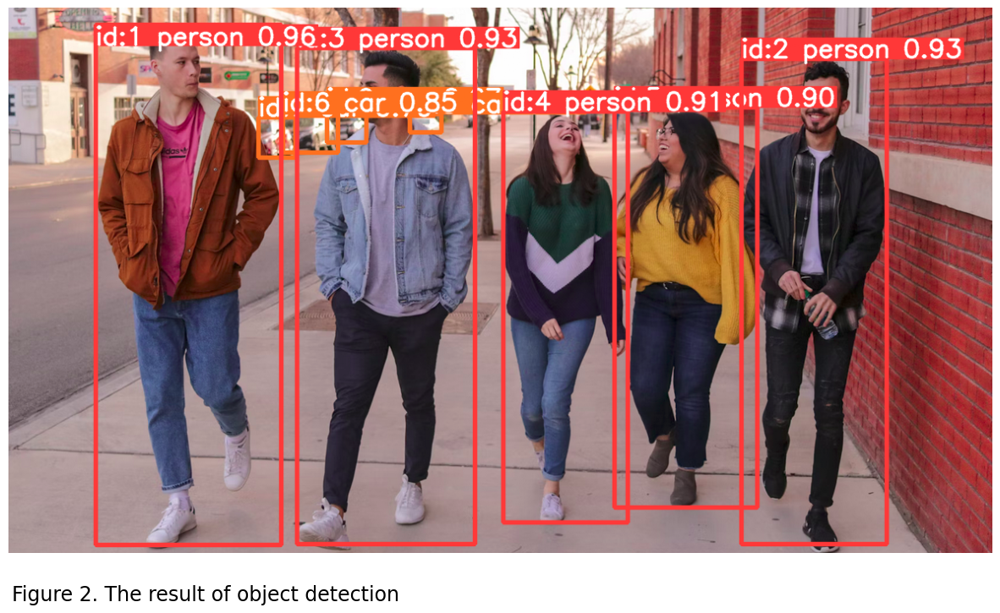

In [22]:
plt.figure(figsize=(15,15))

print("\n\n")

plt.imshow(detected_image)
plt.axis("off")

plt.title("Figure 2. The result of object detection",fontsize=17, x=0.2, y=-.1, ha='center')

plt.show()



### PifPaf pose

In [23]:
pose_detector = opp.Predictor(checkpoint="shufflenetv2k16")
image = Image.open("../inference/image/people.png")
image = Image.open(orig_image_path)
# image = Image.fromarray(orig_image)

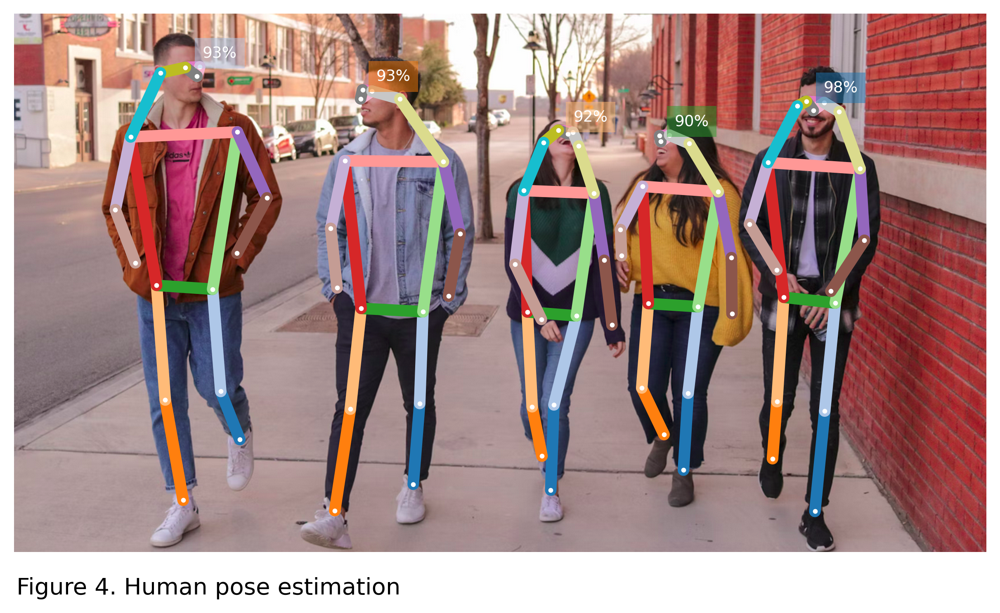

In [24]:
prediction,_,_ = pose_detector.pil_image(image)
detections = []
pose_pred_df = None

print("\n\n")

ann_painter = opp.show.AnnotationPainter()

with opp.show.image_canvas(image) as ax:

    # x_1,y_1,x_2,y_2= [int(x) for x in  prediction[0].bbox()]
    ann_painter.annotations(ax,prediction)
    # rec = plt.Rectangle(((x_2-x_1)/2,(x_2-y_1)/2),(x_2-x_1),(y_2-y_1))
    # opp.show.boxes(ax,np.array(prediction[0].bbox()))
    plt.title("Figure 4. Human pose estimation",fontsize=12, x=0.2, y=-.1, ha='center')

    # ax.add_patch(rec)
    plt.show()





### Tracking

In [25]:
track_result = detecter.track(orig_image_path,show=True,save=True,save_dir='./runs/')


image 1/1 /home/alber/Desktop/DSB3/behavior-tracking-with-landmarks/src/../inference/image/people.png: 384x640 5 persons, 4 cars, 16.5ms
Speed: 1.2ms preprocess, 16.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict10


In [26]:
track_image = plt.imread("runs/detect/predict3/people.png")
# track_image = plt.imread("runs/detect/predict4/first_frame_panel_3.png")

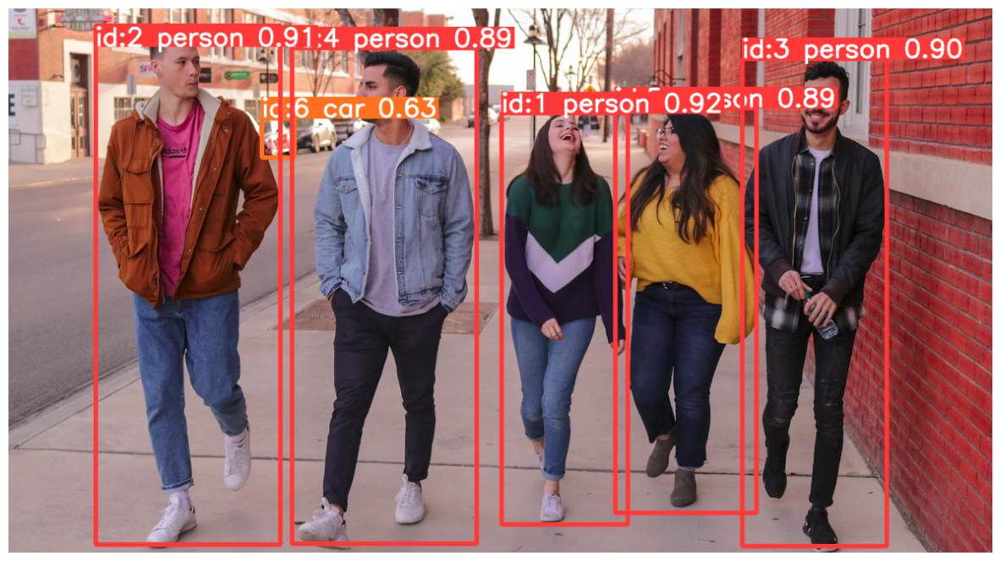

In [27]:
plt.figure(figsize=(15,15))

plt.imshow(track_image)
plt.axis("off")
plt.show()



### All in one

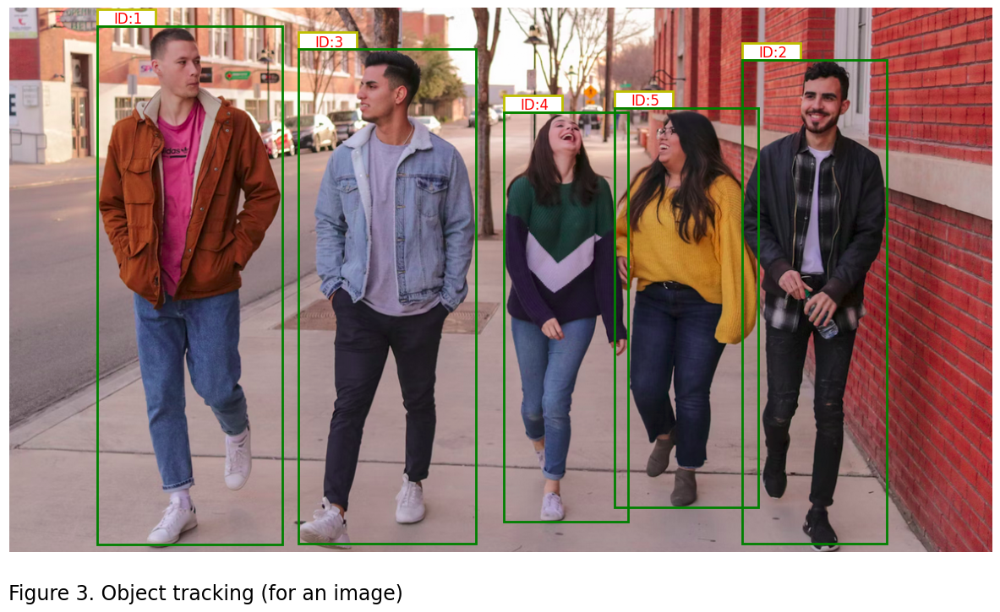

In [28]:
fig,ax = plt.subplots(1,1)
fig.set_figheight(15)
fig.set_figwidth(15)

print("\n\n")


for res in track_result[0]:
    bbox = res.boxes
    ID = bbox.id.item()
    cls = bbox.cls.item()
    
    if cls != 0:
        continue
    
    # Extracting bounding box coordinates
    xmin, ymin, xmax, ymax, _, _, _ = [x  for x in bbox.data.cpu().numpy()[0]]
    ymin, ymax = ymin, ymax
    
    
    # Add text for ID
    rect = plt.Rectangle((xmin, ymin-20), 70, 20, linewidth=2, edgecolor='y', facecolor='white')  # Green rectangle with thickness 2
    ax.add_patch(rect)
    
    ax.text(xmin+20, ymin-3, "ID:" + str(int(ID)), fontsize=12, color='r')
    # Create a rectangle patch
    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='g', facecolor='none')  # Green rectangle with thickness 2
    
    # Add the rectangle patch to the axes
    ax.add_patch(rect)

ax.imshow(orig_image)
ax.axis("off")

plt.title("Figure 3. Object tracking (for an image)",fontsize=17, x=0.2, y=-.1, ha='center')

plt.show()



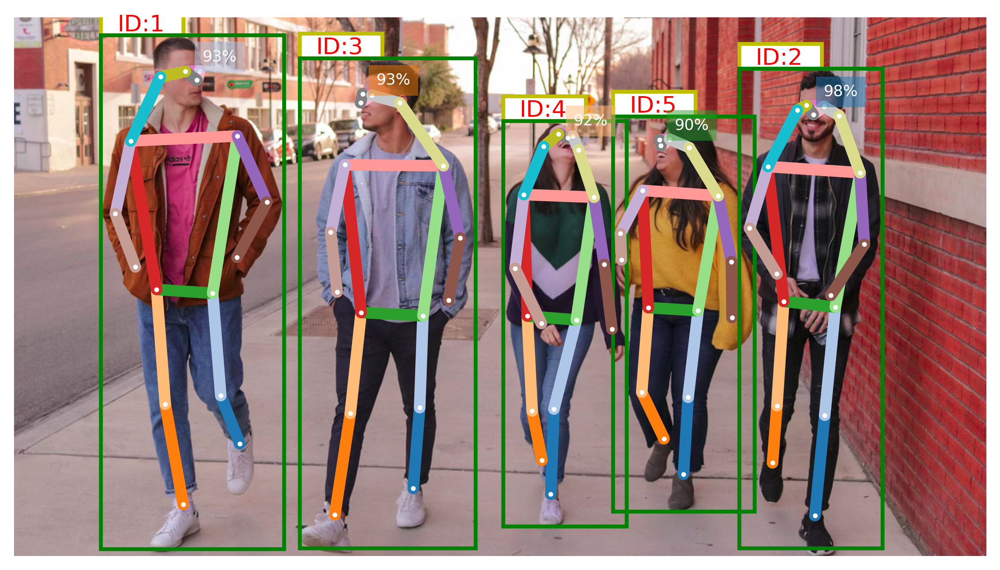

In [29]:
# plt.figure(figsize=(15,15))
# # pifpaf_image = plt.imread("../inference/image/pipaf_result.png").copy() * 0.85
# pifpaf_image = plt.imread("../inference/image/pif_paf_detect_2.png").copy()



# plt.axis("off")

# plt.show()

with opp.show.image_canvas(image) as ax:

    # x_1,y_1,x_2,y_2= [int(x) for x in  prediction[0].bbox()]
    # rec = plt.Rectangle(((x_2-x_1)/2,(x_2-y_1)/2),(x_2-x_1),(y_2-y_1))
    # opp.show.boxes(ax,np.array(prediction[0].bbox()))

    # ax.add_patch(rec)
    for res in track_result[0]:
        bbox = res.boxes
        ID = bbox.id.item()
        cls = bbox.cls.item()
        
        if cls != 0:
            continue
        
        # Extracting bounding box coordinates
        xmin, ymin, xmax, ymax, _, _, _ = [x  for x in bbox.data.cpu().numpy()[0]]
        ymin, ymax = ymin, ymax
        

        
        # Add text for ID
        rect = plt.Rectangle((xmin, ymin-30), 100, 30, linewidth=2, edgecolor='y', facecolor='white')  # Green rectangle with thickness 2
        ax.add_patch(rect)
        
        ax.text(xmin+20, ymin-5, "ID:" + str(int(ID)), fontsize=12, color='r')

        # Create a rectangle patch
        rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='g', facecolor='none')  # Green rectangle with thickness 2
        
        # Add the rectangle patch to the axes
        ax.add_patch(rect)
        
    ann_painter.annotations(ax,prediction)

    plt.show()



### Single image

<Figure size 1500x100 with 0 Axes>

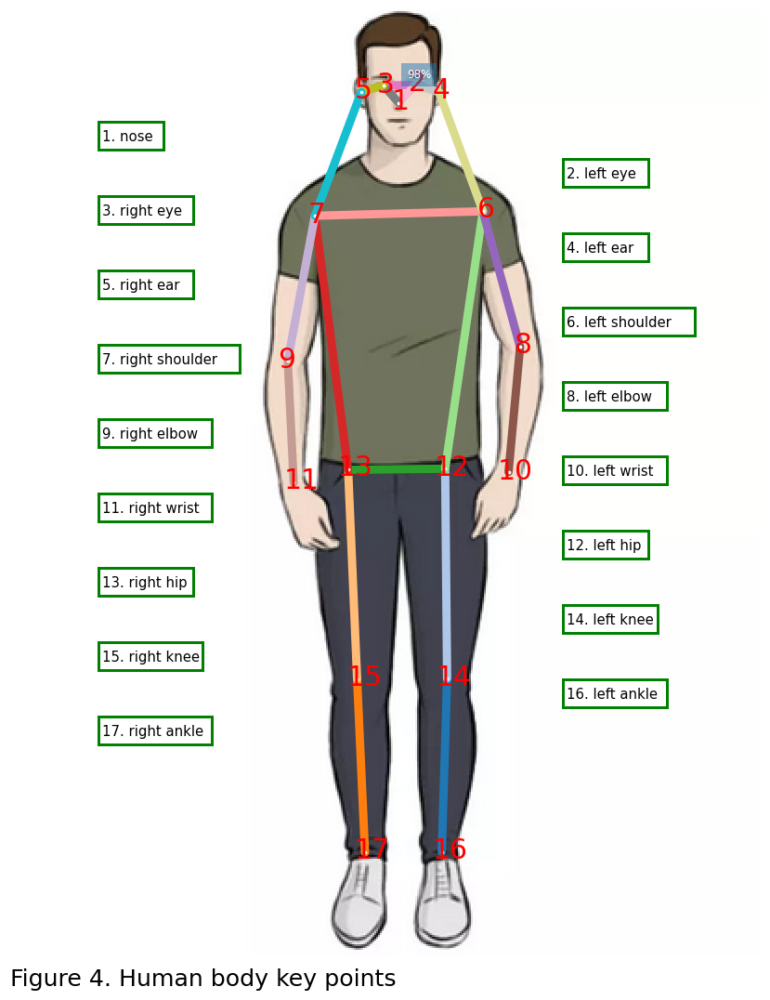

In [33]:
image = Image.open("../inference/image/single_image.png")

prediction,_,_ = pose_detector.pil_image(image)
detections = []
pose_pred_df = None
print()
print()

plt.figure(figsize=(15,1))



ann_painter = opp.show.AnnotationPainter()
text_y = 50

with opp.show.image_canvas(image) as ax:
    
    # ann_painter.annotations(ax,prediction)
    keypoints = prediction[0].data
    for i,key in enumerate(landmark_arm):
        
        x,y,_ = keypoints[i].astype(int)
        # landmark = landmark_arm[key]
    
        landmark = key.replace("_"," ")
    
        ind = str(i+1)
        # ax[1].scatter(x,y,)
        plt.text(x-3 if i < 8 else x-5,y+4,ind,color='red',fontsize=20)
    
        text_x = 20 if i%2 == 0 else 270
    

        rect = plt.Rectangle((text_x-2,text_y+10),5*len(landmark)+6 if i != 0 else 35,15,linewidth=2,edgecolor='green', facecolor='white')

        ax.add_patch(rect)
        
        text_y += 20
        plt.text(text_x,text_y,ind + ". " + landmark,color='black')

    ann_painter.annotations(ax,prediction)
    plt.title("Figure 4. Human body key points",fontsize=17, x=0.2, y=-.04, ha='center')

    plt.show()
# plt.show()

In [31]:
# averaged points